Since we are not getting the results we want from the plot of the Structure factor we want to try and change it slightly to see if this does not yield better results.

In [49]:
include("../../Source/types.jl")
include("../../Source/functions.jl")

initializeTwoStatesS (generic function with 1 method)

## Changing vorticity to return int values

In [28]:
# Returns both vorticities and normalized them
function nᵣ(c::SystConstants, ϕ::LatticeSite, ϕᵣ₊₁::LatticeSite, ϕᵣ₊₂::LatticeSite, ϕᵣ₊₁₊₂::LatticeSite, h_pos::Int64)
    vort_θ⁺ = (mod(ϕᵣ₊₁.θ⁺ - ϕ.θ⁺ - ϕ.A[1], two_pi) + mod(ϕᵣ₊₁₊₂.θ⁺ - ϕᵣ₊₁.θ⁺ - (ϕᵣ₊₁.A[2] + two_pi*c.f*h_pos), two_pi)
        - mod(ϕᵣ₊₁₊₂.θ⁺ - ϕᵣ₊₂.θ⁺ - ϕᵣ₊₂.A[1], two_pi) 
        - mod(ϕᵣ₊₂.θ⁺ - ϕ.θ⁺ - (ϕ.A[2] + two_pi*c.f*(h_pos-1)), two_pi))
    vort_θ⁻ = (mod(ϕᵣ₊₁.θ⁻ - ϕ.θ⁻ - ϕ.A[1], two_pi) + mod(ϕᵣ₊₁₊₂.θ⁻ - ϕᵣ₊₁.θ⁻ - (ϕᵣ₊₁.A[2] + two_pi*c.f*h_pos), two_pi)
        - mod(ϕᵣ₊₁₊₂.θ⁻ - ϕᵣ₊₂.θ⁻ - ϕᵣ₊₂.A[1], two_pi) 
        - mod(ϕᵣ₊₂.θ⁻ - ϕ.θ⁻ - (ϕ.A[2] + two_pi*c.f*(h_pos-1)), two_pi))
    return vort_θ⁺, vort_θ⁻
end

nᵣ (generic function with 1 method)

In [8]:
using BenchmarkTools
x = rand() + 20
@benchmark convert(Int, round($x, 0))

BenchmarkTools.Trial: 
  memory estimate:  0 bytes
  allocs estimate:  0
  --------------
  minimum time:     19.135 ns (0.00% GC)
  median time:      19.493 ns (0.00% GC)
  mean time:        20.427 ns (0.00% GC)
  maximum time:     59.080 ns (0.00% GC)
  --------------
  samples:          10000
  evals/sample:     997

In [9]:
@benchmark Int(round($x, 0))

BenchmarkTools.Trial: 
  memory estimate:  0 bytes
  allocs estimate:  0
  --------------
  minimum time:     19.150 ns (0.00% GC)
  median time:      19.484 ns (0.00% GC)
  mean time:        20.020 ns (0.00% GC)
  maximum time:     59.928 ns (0.00% GC)
  --------------
  samples:          10000
  evals/sample:     997

## Testing new vorticity funciton

In [43]:
println("\nTesting n⁺\n----------------------------------------------------------------")
# Creating state where there is no contribution from Gauge fields
ψ = State(1, SystConstants(2, 4.0, 0.0, 1.0, 0.0, 1/40))
ϕ = ψ.lattice[2,1]
ϕᵣ₊₁ = ψ.lattice[2,2]
ϕᵣ₊₂ = ψ.lattice[1,1]
ϕᵣ₊₁₊₂ = ψ.lattice[1,2]
println("Checking n⁺ for difference phase configurations.")
# Setting phases manually
ϕ.θ⁺ = π/4
ϕᵣ₊₁.θ⁺ = 3π/4
ϕᵣ₊₂.θ⁺ = 3π/4
ϕᵣ₊₁₊₂.θ⁺ = 5π/4
println(@test nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)[1] == 0)
ϕ.θ⁺ = π/4
ϕᵣ₊₁.θ⁺ = 3π/4
ϕᵣ₊₂.θ⁺ = 7π/4
ϕᵣ₊₁₊₂.θ⁺ = 5π/4
println(@test nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)[1] == -two_pi)
ϕ.θ⁺ = π/4
ϕᵣ₊₁.θ⁺ = -π/4
ϕᵣ₊₂.θ⁺ = -5π/4
ϕᵣ₊₁₊₂.θ⁺ = -3π/4
println(@test nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)[1] == two_pi)

println("Checking nᵣ for random configuration")
ψ = State(2, SystConstants(2, 4.0, 0.0, 1.0, 0.0, 1/40))
ϕ = ψ.lattice[2,1]
ϕᵣ₊₁ = ψ.lattice[2,2]
ϕᵣ₊₂ = ψ.lattice[1,1]
ϕᵣ₊₁₊₂ = ψ.lattice[1,2]
#println(@test nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1) == (n⁺(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1), 
#        n⁻(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)))
println(nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1))




Testing n⁺
----------------------------------------------------------------
Checking n⁺ for difference phase configurations.
Test Passed
Test Passed
Test Passed
Checking nᵣ for random configuration
(5.448945329413547, -6.283185307179586)


### Equilibrating new state and checking it

In [44]:
# We run a simulation with the parameters
g = 0.3    # Gauge coupling
ν = 0.3    # Anisotropy
H = -0.72   # External field

# Other parameters
L = 4     # System length
T = 0.5   # Temperature
γ = 1.0    # Order parameter amplitud

# MC parameters
M = 1000    # Number of measurements
Δt = 400  # Interval between measurements (MCS)

# Calculate periodic boundary conditioned f s.t. fL ∈ N
f = ceil(abs(H/(2π)*L))/L*sign(H)
# Calculate inverse temperature
β = 1/T

# Create system
syst = SystConstants(L, γ, 1/g^2, ν, f, β)
sim = Controls(π/3, 0.4, 3.0)

Controls(1.0471975511965976, 0.4, 3.0)

Finding Equilibrium of
SystConstants(4, 1.0, 11.11111111111111, 0.3, -0.25, 2.0)
Controls(1.0471975511965976, 0.4, 3.0)
Searching for ΔE <= 0..
ΔE <= 0 found at t₀ = 2001!
Checking if average is close to 0..
Equilibrium found at time 13452
over the interval [2001, 2252]
s.t. <ΔE> = 1.2 ± 0.2
std(ΔE) = 3.3


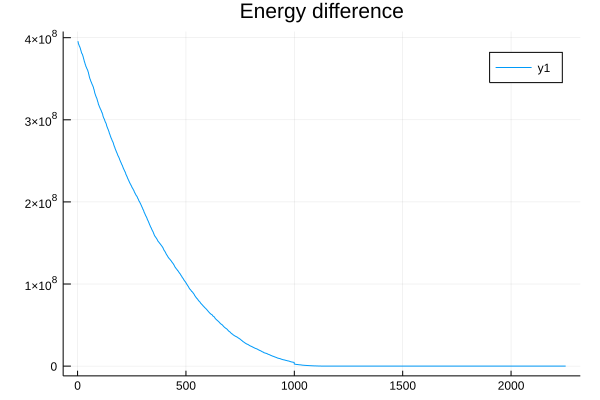

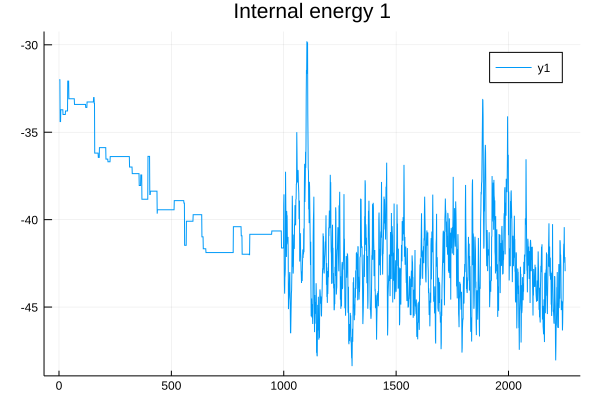

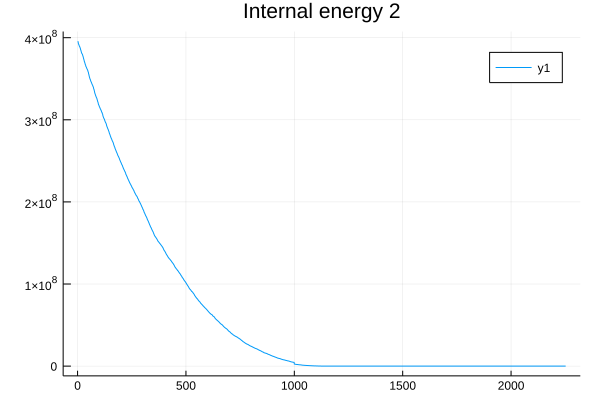

Performing extra MCS
Calculating energies and acceptance rates


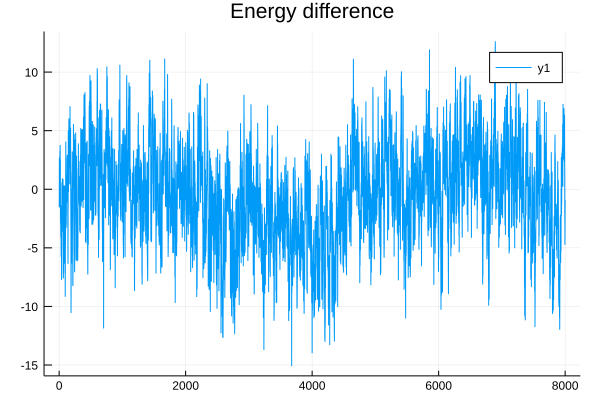

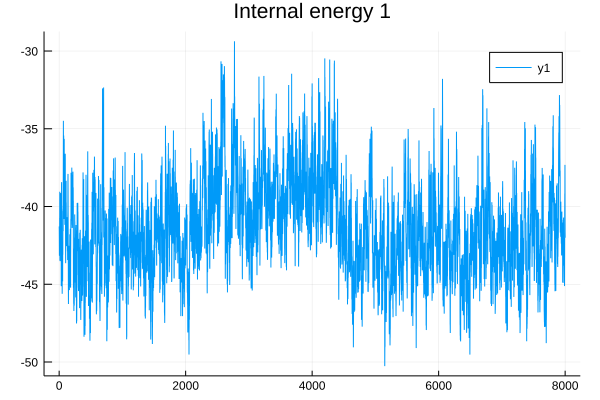

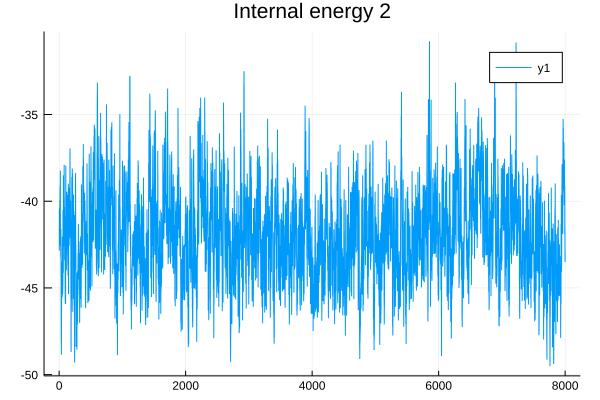

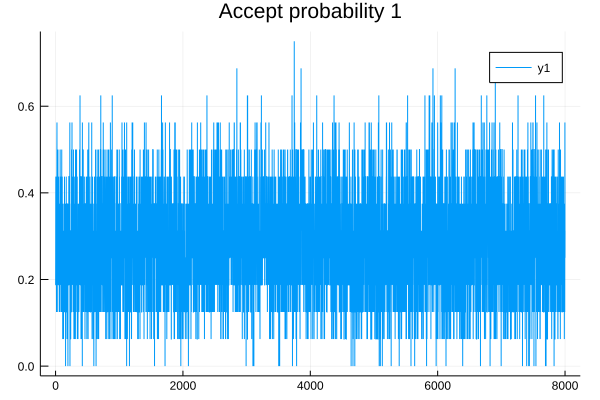

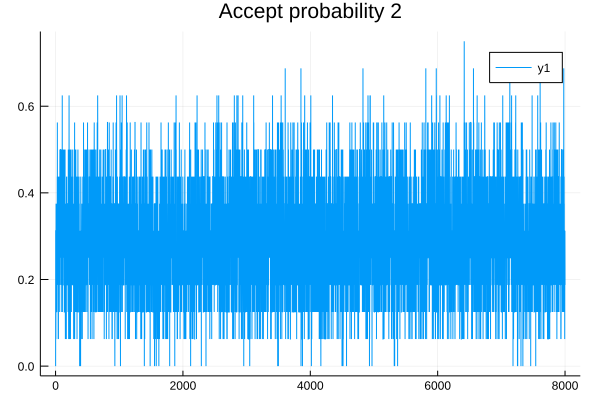

In [45]:
(ψ₁, sim₁, ψ₂, sim₂) = initializeTwoStates(syst, sim);

In [46]:
ϕ = ψ₁.lattice[2,1]
ϕᵣ₊₁ = ψ₁.lattice[2,2]
ϕᵣ₊₂ = ψ₁.lattice[1,1]
ϕᵣ₊₁₊₂ = ψ₁.lattice[1,2]
#println(@test nᵣ(ψ₁.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1) == (n⁺(ψ₁.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1), 
#        n⁻(ψ₁.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)))
println(nᵣ(ψ₁.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)./two_pi)
println((n⁺(ψ₁.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)/two_pi, n⁻(ψ₁.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)/two_pi))

(-0.7242838795860246, 1.4135798584282297e-16)
(0.2757161204139755, 0.2757161204139749)


## Implementing new int vorticity into structure function average
We also change origo to be in the middle of the lattice at $\big[\lfloor L/2\rfloor, \lfloor L/2\rfloor\big]$

In [43]:
x = 1
y = 1
(x,y) += (1,1)

LoadError: [91mMethodError: no method matching +(::Tuple{Int64,Int64}, ::Tuple{Int64,Int64})[0m
Closest candidates are:
  +(::Any, ::Any, [91m::Any[39m, [91m::Any...[39m) at operators.jl:424[39m

In [50]:
(1, 0).*exp(im*0.5)

(0.8775825618903728 + 0.479425538604203im, 0.0 + 0.0im)

In [3]:
# V⁺ and V⁻ are LxL matrices of plaquettes containing the vorticities of the two components.
function structureFunction{T<:Real, I<:Real}(k::Array{T,1}, ψ::State, V⁺::Array{I,2}, V⁻::Array{I,2})
    sum⁺ = Complex(0)
    sum⁻ = Complex(0)
    L = ψ.consts.L
    origo_l = Int(floor((L-1)/2))
    origo_r = L-1-origo_l # For a lattice where L is odd, origo will be in the center.
    
    # Sum over all the plaquettes in the whole lattice
    for h_pos = 1:L
        for v_pos = 1:L
            r = [h_pos-1-origo_l, origo_r+1-v_pos]
            sum⁺ += V⁺[v_pos,h_pos]*exp(im*(k⋅r))
            sum⁻ += V⁻[v_pos,h_pos]*exp(im*(k⋅r))
        end
    end
    
    return (abs2(sum⁺),abs2(sum⁻))
end

structureFunction (generic function with 2 methods)

In [57]:
(zeros(Int,4,4)[1,1], zeros(Int,4,4)[1,1]) = (1,1)

(1, 1)

In [4]:
function vortexSnapshot(ψ::State)
    L = ψ.consts.L
    V⁺ = zeros(L,L)
    V⁻ = zeros(L,L)
    
    # Sum over the corners
    # Upper left corner
     ϕ = ψ.lattice[1,1]
     ϕᵣ₊₁ = ψ.lattice[1,2]
     ϕᵣ₊₂ = ψ.lattice[L,1]
     ϕᵣ₊₁₊₂ = ψ.lattice[L,2]
    (V⁺[1,1], V⁻[1,1]) = nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)
    
    # Lower left corner
     ϕ = ψ.lattice[L,1]
     ϕᵣ₊₁ = ψ.lattice[L,2]
     ϕᵣ₊₂ = ψ.lattice[L-1,1]
     ϕᵣ₊₁₊₂ = ψ.lattice[L-1,2]
    (V⁺[L,1], V⁻[L,1]) = nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)
    
    # Lower right corner
     ϕ = ψ.lattice[L,L]
     ϕᵣ₊₁ = ψ.lattice[L,1]
     ϕᵣ₊₂ = ψ.lattice[L-1,L]
     ϕᵣ₊₁₊₂ = ψ.lattice[L-1,1]
    (V⁺[L,L], V⁻[L,L]) = nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, L)
    
    # Upper right corner
     ϕ = ψ.lattice[1,L]
     ϕᵣ₊₁ = ψ.lattice[1,1]
     ϕᵣ₊₂ = ψ.lattice[L,L]
     ϕᵣ₊₁₊₂ = ψ.lattice[L,1]
    (V⁺[1,L], V⁻[1,L]) = nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, L)
    
    # Sum over borders without corners
    for i = 2:(L-1)
        # Upper border (counting in +x direction)
        ϕ = ψ.lattice[1,i]
        ϕᵣ₊₁ = ψ.lattice[1,i+1]
        ϕᵣ₊₂ = ψ.lattice[L,i]
        ϕᵣ₊₁₊₂ = ψ.lattice[L,i+1]
        (V⁺[1,i], V⁻[1,i]) = nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, i)
        
        # Left border (counting in -y direction)
        ϕ = ψ.lattice[i,1]
        ϕᵣ₊₁ = ψ.lattice[i,2]
        ϕᵣ₊₂ = ψ.lattice[i-1,1]
        ϕᵣ₊₁₊₂ = ψ.lattice[i-1,2]
        (V⁺[i,1], V⁻[i,1]) = nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, 1)
        
        # Lower border (counting in +x direction)
        ϕ = ψ.lattice[L,i]
        ϕᵣ₊₁ = ψ.lattice[L,i+1]
        ϕᵣ₊₂ = ψ.lattice[L-1,i]
        ϕᵣ₊₁₊₂ = ψ.lattice[L-1,i+1]
        (V⁺[L,i], V⁻[L,i]) = nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, i)
        
        # Right border (counting in -y direction)
        ϕ = ψ.lattice[i,L]
        ϕᵣ₊₁ = ψ.lattice[i,1]
        ϕᵣ₊₂ = ψ.lattice[i-1,L]
        ϕᵣ₊₁₊₂ = ψ.lattice[i-1,1]
        (V⁺[i,L], V⁻[i,L]) = nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, L)
    end
    
    # Sum over rest of the bulk
    for h_pos = 2:(L-1)
        for v_pos = 2:(L-1)
            ϕ = ψ.lattice[v_pos,h_pos]
            ϕᵣ₊₁ = ψ.lattice[v_pos,h_pos+1]
            ϕᵣ₊₂ = ψ.lattice[v_pos-1,h_pos]
            ϕᵣ₊₁₊₂ = ψ.lattice[v_pos-1,h_pos+1]
            (V⁺[v_pos,h_pos], V⁻[v_pos, h_pos]) = nᵣ(ψ.consts, ϕ, ϕᵣ₊₁, ϕᵣ₊₂, ϕᵣ₊₁₊₂, h_pos)
        end
    end
    
    return (V⁺, V⁻)
end


vortexSnapshot (generic function with 2 methods)

In [63]:
mean([rand(10,10) for i = 1:10000])

10×10 Array{Float64,2}:
 0.499087  0.494736  0.500664  0.496987  …  0.49469   0.502373  0.498746
 0.501441  0.498951  0.507157  0.499987     0.503665  0.496464  0.497348
 0.500809  0.496983  0.500991  0.49932      0.500057  0.502647  0.499616
 0.503385  0.503148  0.499322  0.501045     0.498018  0.503968  0.499014
 0.503059  0.502477  0.500116  0.502055     0.50409   0.500409  0.505487
 0.500147  0.497874  0.499169  0.499193  …  0.505059  0.503757  0.49346 
 0.499792  0.499932  0.501149  0.502632     0.497835  0.49493   0.495073
 0.501351  0.502064  0.504008  0.499459     0.499476  0.498999  0.499515
 0.500705  0.496704  0.501066  0.497285     0.501732  0.498716  0.499447
 0.498606  0.496686  0.501121  0.496811     0.5019    0.505522  0.498774

In [26]:
function structureFunctionVortexLatticeAvg!{T<:Real}(ks::Array{Array{T, 1}, 2}, 
        ψ::State, sim::Controls, M::Int64, Δt::Int64)
    syst = ψ.consts
    L = syst.L
    
    # Setup structure factor storage
    Lky = size(ks, 1)
    Lkx = size(ks, 2)
    S⁺ = [zeros(Lky,Lkx) for i=1:M] # Series of matrices, one matrix for each measurement.
    S⁻ = [zeros(Lky,Lkx) for i=1:M]
    Sm⁺ = zeros(Lky,Lkx)
    Sm⁻ = zeros(Lky,Lkx)
    s_norm_inv = 1/(L^2*syst.f*two_pi)^2
    
    # Setup vortex lattice storage
    V⁺ = [zeros(L,L) for i=1:M]    # Matrix containing the series of measurements for each position
    V⁻ = [zeros(L,L) for i=1:M]
    VSm⁺ = zeros(L,L)
    VSm⁻ = zeros(L,L)
    avV⁺ = zeros(L,L)
    avV⁻ = zeros(L,L)
    
    println("Making $(M) measurements using $(M*Δt) MCS over a $(Lkx)×$(Lky) matrix of ks.")
    # Loop over M measurements
    for m = 1:M
        print("Measurement progress: $(Int(round(m/M*100,0)))% \r")
        flush(STDOUT)
        
        # Take Δt MCS
        for i = 1:Δt
            mcSweep!(ψ, sim)
        end
        
        # Find n_z(r) of the lattice.
        (V⁺[m], V⁻[m]) = vortexSnapshot(ψ)
        
        # Calculate average of vorticity second moment. 
        for y = 1:L, x = 1:L
            VSm⁺[y,x] += V⁺[m][y,x]^2
            VSm⁻[y,x] += V⁻[m][y,x]^2
        end
        
        # Find structure factor. 
        for y = 1:Lky, x = 1:Lkx
            (S⁺[m][y,x], S⁻[m][y,x]) = s_norm_inv.*structureFunction(ks[y,x], ψ, V⁺[m], V⁻[m])
            Sm⁺[y,x] += S⁺[m][y,x]^2
            Sm⁻[y,x] += S⁻[m][y,x]^2
        end
        
        V⁺[m] = V⁺[m]./two_pi
        V⁻[m] = V⁻[m]./two_pi
    end
    
    # Error calculation of average vorticity
    τ_V⁺ = [autocorrTime([V⁺[m][y,x] for m=1:M], 5.0) for y=1:L, x=1:L]
    τ_V⁻ = [autocorrTime([V⁻[m][y,x] for m=1:M], 5.0) for y=1:L, x=1:L]
    errV⁺ = zeros(L,L)
    errV⁻ = zeros(L,L)
    
    avV⁺ = mean(V⁺)
    avV⁻ = mean(V⁻)
    
    for y=1:L, x=1:L
        VSm⁺[y,x] /= M
        VSm⁻[y,x] /= M
        errV⁺[y,x] = (1+2*τ_V⁺[y,x])*(VSm⁺[y,x] - avV⁺[y,x]^2)/(M-1)
        errV⁻[y,x] = (1+2*τ_V⁻[y,x])*(VSm⁻[y,x] - avV⁻[y,x]^2)/(M-1)
    end
    
    # Error calculation of structure factor.
    avS⁺ = mean(S⁺)
    avS⁻ = mean(S⁻)
    τ_S⁺ = [autocorrTime([S⁺[m][y,x] for m=1:M], 5.0) for y=1:Lky, x=1:Lkx]
    τ_S⁻ = [autocorrTime([S⁻[m][y,x] for m=1:M], 5.0) for y=1:Lky, x=1:Lkx]
    errS⁺ = [0.0 for y=1:Lky, x=1:Lkx]
    errS⁻ = [0.0 for y=1:Lky, x=1:Lkx]
    
    for y=1:Lky, x=1:Lkx
        Sm⁺[y,x] /= M
        Sm⁻[y,x] /= M
        errS⁺[y,x] = (1+2*τ_S⁺[y,x])*(Sm⁺[y,x] - avS⁺[y,x]^2)/(M-1)
        errS⁻[y,x] = (1+2*τ_S⁻[y,x])*(Sm⁻[y,x] - avS⁻[y,x]^2)/(M-1)
    end
    
    # Finding max values over the matrices.
    max_S⁺= maximum(avS⁺)
    max_S⁻ = maximum(avS⁻)
    max_err_S⁺ = maximum(errS⁺)
    max_err_S⁻ = maximum(errS⁻)
    max_τ_S⁺ = maximum(τ_S⁺)
    max_τ_S⁻ = maximum(τ_S⁻)
    println("\nMax (S⁺, S⁻)\n($(max_S⁺), $(max_S⁻))")
    println("Max δ(S⁺, S⁻)\n($(max_err_S⁺), $(max_err_S⁻))")
    println("Max correlation time\n($(max_τ_S⁺), $(max_τ_S⁻))")
    
    return (avV⁺, errV⁺, V⁺, avV⁻, errV⁻, V⁻, avS⁺, errS⁺, S⁺, avS⁻, errS⁻, S⁻)
end


structureFunctionVortexLatticeAvg! (generic function with 1 method)

## Testing and Benchmarking

In [6]:
# We run a simulation with the parameters
g = 0.3    # Gauge coupling
ν = 0.3    # Anisotropy
H = -0.72   # External field

# Other parameters
L = 100     # System length
T = 0.09   # Temperature
γ = 1.0    # Order parameter amplitud

# MC parameters
M = 100    # Number of measurements
Δt = 200  # Interval between measurements (MCS)

# Calculate periodic boundary conditioned f s.t. fL ∈ N
f = ceil(abs(H/(2π)*L))/L*sign(H)
# Calculate inverse temperature
β = 1/T

# Create system
syst = SystConstants(L, γ, 1/g^2, ν, f, β)
sim = Controls(π/3, 0.4, 3.0)

Controls(1.0471975511965976, 0.4, 3.0)

Finding Equilibrium of
SystConstants(100, 1.0, 11.11111111111111, 0.3, -0.12, 11.11111111111111)
Controls(1.0471975511965976, 0.4, 3.0)
Searching for ΔE <= 0..


Excessive output truncated after 524309 bytes.

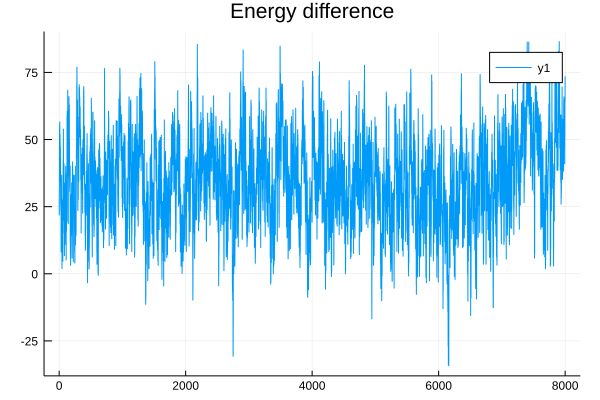

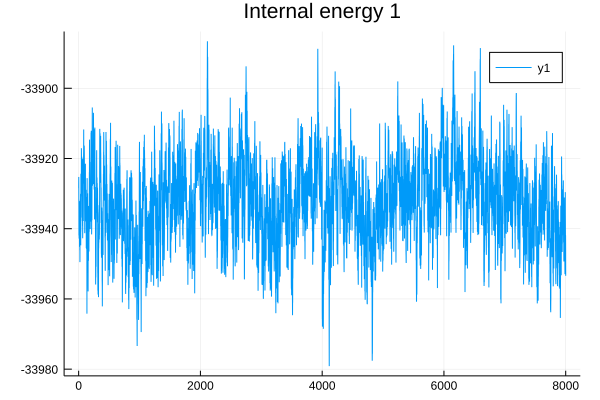

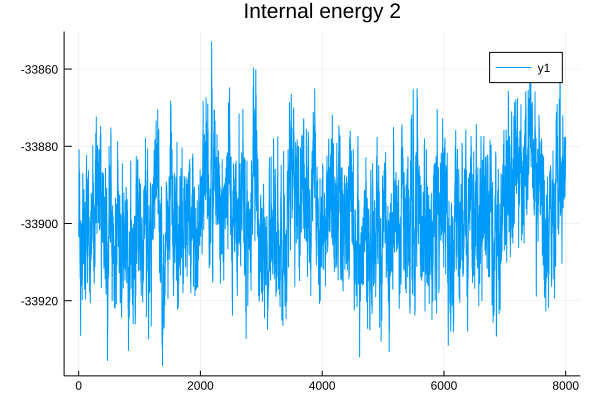

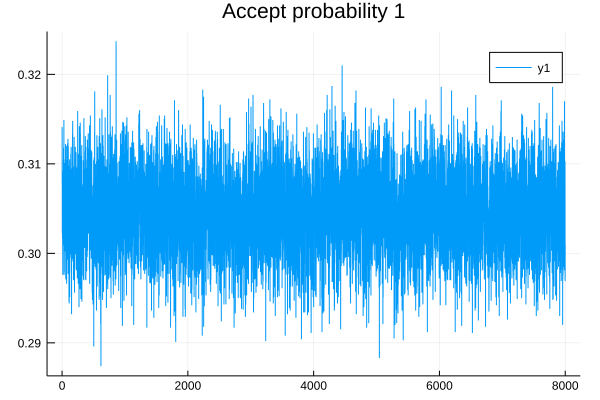

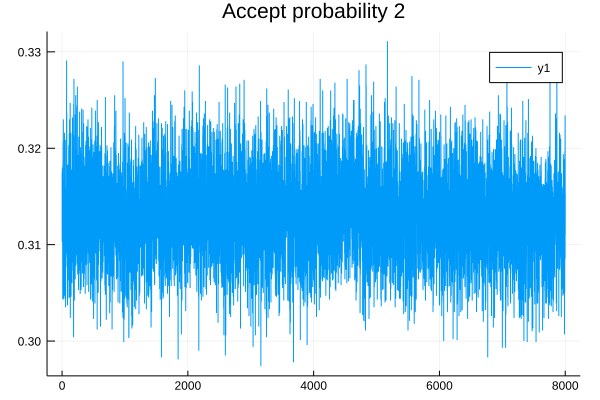

In [8]:
(ψ₁, sim₁, ψ₂, sim₂) = initializeTwoStates(syst, sim);

In [9]:
# Making k-lattice
# Construct k-matrix where the horizontal axis contains kx ∈ [-π, π), while
# the vertical axis contain ky ∈ [-π, π) at the second component
L_k = L
k_matrix = [[2π/L_k*(x-1-L_k/2), 2π/L_k*(L_k/2-y)] for y=1:L_k, x=1:L_k]

# Making measurements with old function
@time (avV⁺, errV⁺, V⁺, avV⁻, errV⁻, V⁻, avS⁺, errS⁺, S⁺, avS⁻, errS⁻, S⁻) = structureFunctionVortexLatticeAvg!(k_matrix, 
    ψ₁, sim, M, Δt);

Making 1000 measurements using 200000 MCS over a 100×100 matrix of ks.


LoadError: [91mInterruptException:[39m

In [29]:
(avV⁺, errV⁺, V⁺, avV⁻, errV⁻, V⁻, avS⁺, errS⁺, S⁺, avS⁻, errS⁻, S⁻) = structureFunctionVortexLatticeAvg!(k_matrix, 
    ψ₁, sim, 30, 100);

Making 30 measurements using 3000 MCS over a 100×100 matrix of ks.
Measurement progress: 100% 
Max (S⁺, S⁻)
(0.03422421127981809, 0.49469476282577035)
Max δ(S⁺, S⁻)
(4.172235952294031e-5, 5.8367754797773876e-5)
Max correlation time
(1.0, 1.0)


In [52]:
autocor(rand(30))

16-element Array{Float64,1}:
  1.0       
  0.142687  
 -0.134361  
 -0.0605853 
 -0.0539231 
 -0.0261054 
 -0.179068  
 -0.162262  
  0.0954107 
  0.214909  
  0.113565  
  0.0686511 
  0.0344567 
 -0.0737037 
 -0.0404661 
 -0.00510428

In [88]:
# -----------------------------------------------------------------------------------------------------------
# Plotting result of structureFunctionVortexLatticeAvg!
function plotStructureFunctionVortexLattice{T<:Real, R<:Real}(avV⁺::Array{T, 2}, avV⁻::Array{T, 2}, 
        V⁺::Array{R, 2}, V⁻::Array{R,2}, avS⁺::Array{T, 2}, avS⁻::Array{T,2}, ks::Array{Array{T,1}, 2})
    L = size(avV⁺,1)
    # Plotting structure factor
    L_k = size(ks, 1)
	k_x = [ks[L_k,x][1] for x=1:L_k]
    k_y = [ks[y,1][2] for y=1:L_k]
    plt = heatmap(k_x, k_y, avS⁺, title="average S+", xlabel="k_x", ylabel="k_y", aspect_ratio=1)
    display(plt)
    plt = heatmap(k_x, k_y, avS⁻, title="average S-", xlabel="k_x", ylabel="k_y", aspect_ratio=1)
    display(plt)
    
    # Removing middle-point
    println("S⁺(0) ≈ $(avS⁺[Int(ceil(L/2)), Int(ceil(1+L/2))])")
    temp⁺ = avS⁺[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))]
    avS⁺[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))] = avS⁺[Int(ceil(1+L_k/2)), Int(ceil(L_k/2))]
    println("S⁻(0) ≈ $(avS⁻[Int(ceil(L/2)), Int(ceil(1+L/2))])")
    temp⁻ = avS⁻[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))]
    avS⁻[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))] = avS⁻[Int(ceil(1+L_k/2)), Int(ceil(L_k/2))]
    
    # And then re-plotting
    plt = heatmap(k_x, k_y, avS⁺, 
        title="average S+ with S(0) removed", xlabel="k_x", ylabel="k_y", aspect_ratio=1)
    display(plt)
    plt = heatmap(k_x, k_y, avS⁻, 
        title="average S- with S(0) removed", xlabel="k_x", ylabel="k_y", aspect_ratio=1)
    display(plt)
    
    # Restoring middle point
    avS⁺[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))] = temp⁺
    avS⁻[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))] = temp⁻
    
    # Plotting vortex snapshots
    plt = heatmap(1:L, 1:L, V⁺, title="Snapshot of + component vorticity", xlabel="x", ylabel="y", aspect_ratio=1)
    display(plt)
    plt = heatmap(1:L, 1:L, V⁻, title="Snapshot of - component vorticity", xlabel="x", ylabel="y", aspect_ratio=1)
    display(plt)
    
    # Combining matrices
    combined_lattice = combineVortexLattices(V⁺, V⁻)
    plt = heatmap(1:L, 1:L, combined_lattice, title="Combination of snapshots", xlabel="x", ylabel="y", aspect_ratio=1)
    display(plt)
    
    # Finding the proportion of the different kinds of vortices in combined matrix
    av_vortex_kinds = zeros(9)
    for v_pos = 1:L, h_pos = 1:L
        if combined_lattice[v_pos, h_pos] >= 0
            av_vortex_kinds[combined_lattice[v_pos, h_pos]+1] += 1
        end
    end
    av_vortex_kinds *= 100/L^2
    println("The proportion of vortices (n⁺, n⁻) in snapshot")
    println("% of vortex kind (-1, -1): \t$(Int(round(av_vortex_kinds[1],0)))")
    println("% of vortex kind (-1, 0): \t$(Int(round(av_vortex_kinds[2],0)))")
    println("% of vortex kind (-1, 1): \t$(Int(round(av_vortex_kinds[3],0)))")
    println("% of vortex kind (0, -1): \t$(Int(round(av_vortex_kinds[4],0)))")
    println("% of vortex kind (0, 0): \t$(Int(round(av_vortex_kinds[5],0)))")
    println("% of vortex kind (0, 1): \t$(Int(round(av_vortex_kinds[6],0)))")
    println("% of vortex kind (1, -1): \t$(Int(round(av_vortex_kinds[7],0)))")
    println("% of vortex kind (1, 0): \t$(Int(round(av_vortex_kinds[8],0)))")
    println("% of vortex kind (1, 1): \t$(Int(round(av_vortex_kinds[9],0)))\n")
    
    # Calculating the sum of vortices of snapshot
    sum⁺ = 0.0
    sum⁻ = 0.0
    for h_pos = 1:L, v_pos = 1:L
        sum⁺ += V⁺[v_pos, h_pos]
        sum⁻ += V⁻[v_pos, h_pos]
    end
    println("Sum of + component vorticity in the snapshot: $(sum⁺)")
    println("Sum of - component vorticity in the snapshot: $(sum⁻)")
    flush(STDOUT)
    
    # Plotting vortex averages
    plt = heatmap(1:L, 1:L, avV⁺, title="Average + component vorticity", xlabel="x", ylabel="y", aspect_ratio=1)
    display(plt)
    plt = heatmap(1:L, 1:L, avV⁻, title="Average - component vorticity", xlabel="x", ylabel="y", aspect_ratio=1)
    display(plt)
end 


plotStructureFunctionVortexLattice (generic function with 2 methods)

In [89]:
# -----------------------------------------------------------------------------------------------------------
# Plotting result of structureFunctionVortexLatticeAvg!
function plotStructureFunctionVortexLatticeS{T<:Real, R<:Real}(avV⁺::Array{T, 2}, avV⁻::Array{T, 2}, 
        V⁺::Array{R, 2}, V⁻::Array{R,2}, avS⁺::Array{T, 2}, avS⁻::Array{T,2}, ks::Array{Array{T,1}, 2})
    L = size(avV⁺,1)
    # Plotting structure factor
    L_k = size(ks, 1)
	k_x = [ks[L_k,x][1] for x=1:L_k]
    k_y = [ks[y,1][2] for y=1:L_k]
    plt = heatmap(k_x, k_y, avS⁺, title="average S+", xlabel="k_x", ylabel="k_y", aspect_ratio=1)
    savefig(plt, "sfvl_avg_S+_plot.pdf")
    plt = heatmap(k_x, k_y, avS⁻, title="average S-", xlabel="k_x", ylabel="k_y", aspect_ratio=1)
    savefig(plt, "sfvl_avg_S-_plot.pdf")
    
    # Removing middle-point
    println("S⁺(0) ≈ $(avS⁺[Int(ceil(L/2)), Int(ceil(1+L/2))])")
    temp⁺ = avS⁺[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))]
    avS⁺[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))] = avS⁺[Int(ceil(1+L_k/2)), Int(ceil(L_k/2))]
    println("S⁻(0) ≈ $(avS⁻[Int(ceil(L/2)), Int(ceil(1+L/2))])")
    temp⁻ = avS⁻[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))]
    avS⁻[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))] = avS⁻[Int(ceil(1+L_k/2)), Int(ceil(L_k/2))]
    
    # And then re-plotting
    plt = heatmap(k_x, k_y, avS⁺, 
        title="average S+ with S(0) removed", xlabel="k_x", ylabel="k_y", aspect_ratio=1)
    savefig(plt, "sfvl_avg_S+_removed_plot.pdf")
    plt = heatmap(k_x, k_y, avS⁻, 
        title="average S- with S(0) removed", xlabel="k_x", ylabel="k_y", aspect_ratio=1)
    savefig(plt, "sfvl_avg_S-_removed_plot.pdf")
    
    # Restoring middle point
    avS⁺[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))] = temp⁺
    avS⁻[Int(ceil(L_k/2)), Int(ceil(1+L_k/2))] = temp⁻
    
    # Plotting vortex snapshots
    plt = heatmap(1:L, 1:L, V⁺, title="Snapshot of + component vorticity", xlabel="x", ylabel="y", aspect_ratio=1)
    savefig(plt, "sfvl_V+_snapshot_plot.pdf")
    plt = heatmap(1:L, 1:L, V⁻, title="Snapshot of - component vorticity", xlabel="x", ylabel="y", aspect_ratio=1)
    savefig(plt, "sfvl_V-_snapshot_plot.pdf")
    
    # Combining matrices
    combined_lattice = combineVortexLattices(V⁺, V⁻)
    plt = heatmap(1:L, 1:L, combined_lattice, title="Combination of snapshots", xlabel="x", ylabel="y", aspect_ratio=1)
    savefig(plt, "sfvl_comb_snapshort_plot.pdf")
    
    # Finding the proportion of the different kinds of vortices in combined matrix
    av_vortex_kinds = zeros(9)
    for v_pos = 1:L, h_pos = 1:L
        if combined_lattice[v_pos, h_pos] >= 0
            av_vortex_kinds[combined_lattice[v_pos, h_pos]+1] += 1
        end
    end
    av_vortex_kinds *= 100/L^2
    println("The proportion of vortices (n⁺, n⁻) in snapshot")
    println("% of vortex kind (-1, -1): \t$(Int(round(av_vortex_kinds[1],0)))")
    println("% of vortex kind (-1, 0): \t$(Int(round(av_vortex_kinds[2],0)))")
    println("% of vortex kind (-1, 1): \t$(Int(round(av_vortex_kinds[3],0)))")
    println("% of vortex kind (0, -1): \t$(Int(round(av_vortex_kinds[4],0)))")
    println("% of vortex kind (0, 0): \t$(Int(round(av_vortex_kinds[5],0)))")
    println("% of vortex kind (0, 1): \t$(Int(round(av_vortex_kinds[6],0)))")
    println("% of vortex kind (1, -1): \t$(Int(round(av_vortex_kinds[7],0)))")
    println("% of vortex kind (1, 0): \t$(Int(round(av_vortex_kinds[8],0)))")
    println("% of vortex kind (1, 1): \t$(Int(round(av_vortex_kinds[9],0)))\n")
    
    # Calculating the sum of vortices of snapshot
    sum⁺ = 0.0
    sum⁻ = 0.0
    for h_pos = 1:L, v_pos = 1:L
        sum⁺ += V⁺[v_pos, h_pos]
        sum⁻ += V⁻[v_pos, h_pos]
    end
    println("Sum of + component vorticity in the snapshot: $(sum⁺)")
    println("Sum of - component vorticity in the snapshot: $(sum⁻)")
    flush(STDOUT)
    
    # Plotting vortex averages
    plt = heatmap(1:L, 1:L, avV⁺, title="Average + component vorticity", xlabel="x", ylabel="y", aspect_ratio=1)
    savefig(plt, "sfvl_avg_V+_plot.pdf")
    plt = heatmap(1:L, 1:L, avV⁻, title="Average - component vorticity", xlabel="x", ylabel="y", aspect_ratio=1)
    savefig(plt, "sfvl_avg_V-_plot.pdf")
    
    # Saving average matrices to file
    writedlm("avg_S+.data", avS⁺, ":")
    writedlm("avg_S-.data", avS⁻, ":")
    writedlm("avg_V+.data", avV⁺, ":")
    writedlm("avg_V-.data", avV⁻, ":")
    writedlm("k_x_range.data", k_x, ":")
    writedlm("k_y_range.data", k_y, ":")
    
    return 1
end 


plotStructureFunctionVortexLatticeS (generic function with 2 methods)

In [93]:
k_matrix

100×100 Array{Array{Float64,1},2}:
 [-3.14159, 3.07876]   [-3.07876, 3.07876]   …  [3.07876, 3.07876] 
 [-3.14159, 3.01593]   [-3.07876, 3.01593]      [3.07876, 3.01593] 
 [-3.14159, 2.9531]    [-3.07876, 2.9531]       [3.07876, 2.9531]  
 [-3.14159, 2.89027]   [-3.07876, 2.89027]      [3.07876, 2.89027] 
 [-3.14159, 2.82743]   [-3.07876, 2.82743]      [3.07876, 2.82743] 
 [-3.14159, 2.7646]    [-3.07876, 2.7646]    …  [3.07876, 2.7646]  
 [-3.14159, 2.70177]   [-3.07876, 2.70177]      [3.07876, 2.70177] 
 [-3.14159, 2.63894]   [-3.07876, 2.63894]      [3.07876, 2.63894] 
 [-3.14159, 2.57611]   [-3.07876, 2.57611]      [3.07876, 2.57611] 
 [-3.14159, 2.51327]   [-3.07876, 2.51327]      [3.07876, 2.51327] 
 [-3.14159, 2.45044]   [-3.07876, 2.45044]   …  [3.07876, 2.45044] 
 [-3.14159, 2.38761]   [-3.07876, 2.38761]      [3.07876, 2.38761] 
 [-3.14159, 2.32478]   [-3.07876, 2.32478]      [3.07876, 2.32478] 
 ⋮                                           ⋱                     
 [-3.14159, -

In [98]:
L_k = size(k_matrix,1)
[k_matrix[x,1][2] for x=1:L_k]

100-element Array{Float64,1}:
  3.07876
  3.01593
  2.9531 
  2.89027
  2.82743
  2.7646 
  2.70177
  2.63894
  2.57611
  2.51327
  2.45044
  2.38761
  2.32478
  ⋮      
 -2.45044
 -2.51327
 -2.57611
 -2.63894
 -2.70177
 -2.7646 
 -2.82743
 -2.89027
 -2.9531 
 -3.01593
 -3.07876
 -3.14159

In [20]:
errS⁺[rand(1:L), rand(1:L)]

5.171984817100205e-7

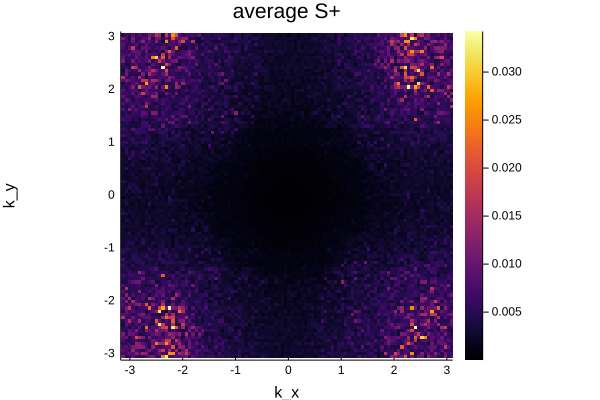

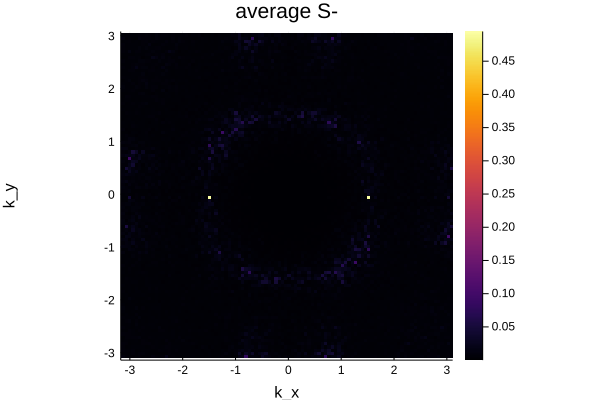

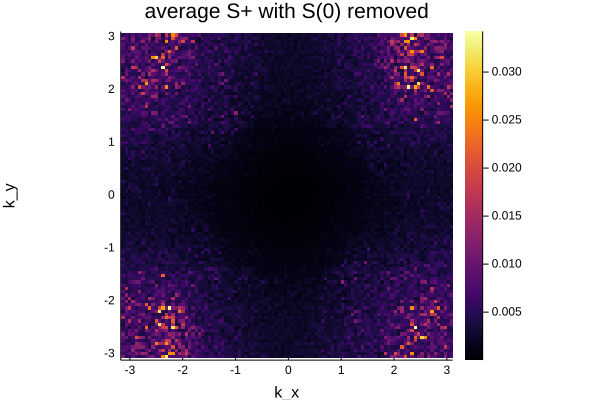

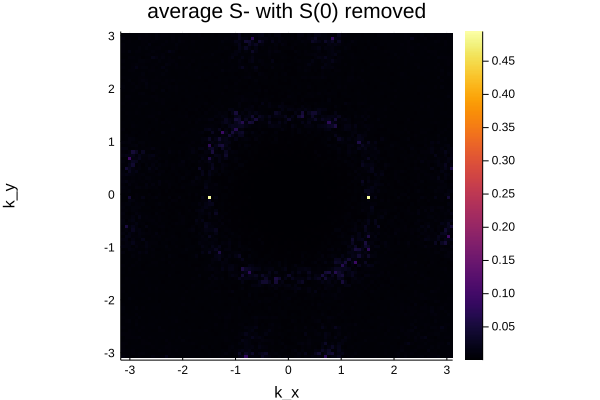

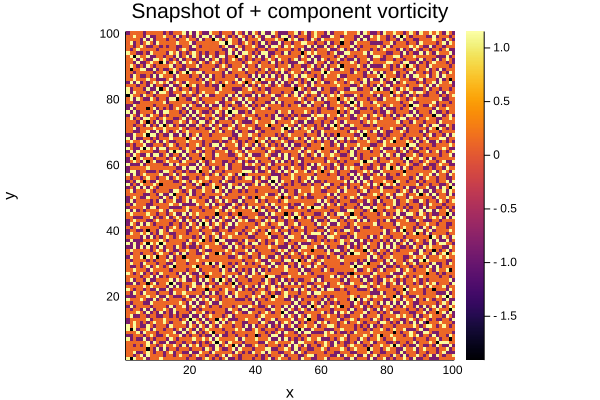

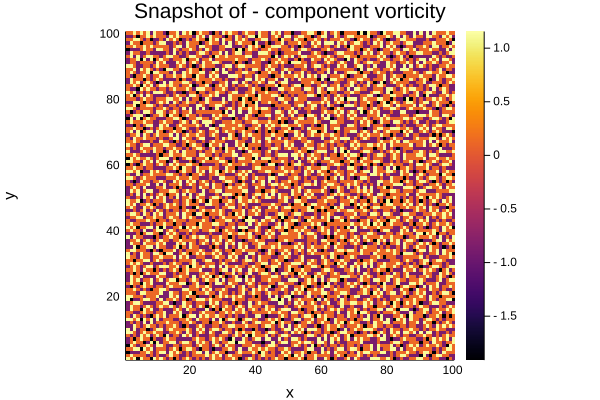

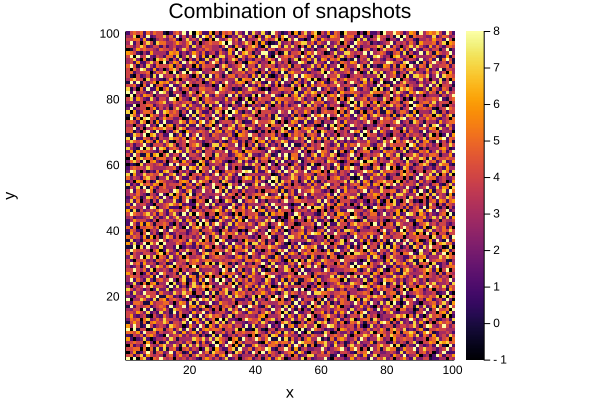

S⁺(0) ≈ 1.5716125757423147e-34
S⁻(0) ≈ 1.1240151364942047e-33
The proportion of vortices (n⁺, n⁻) in snapshot
% of vortex kind (-1, -1): 	7
% of vortex kind (-1, 0): 	14
% of vortex kind (-1, 1): 	7
% of vortex kind (0, -1): 	15
% of vortex kind (0, 0): 	21
% of vortex kind (0, 1): 	11
% of vortex kind (1, -1): 	5
% of vortex kind (1, 0): 	8
% of vortex kind (1, 1): 	6

Sum of + component vorticity in the snapshot: -3.9968028886505635e-15
Sum of - component vorticity in the snapshot: -5.0154325137441447e-14


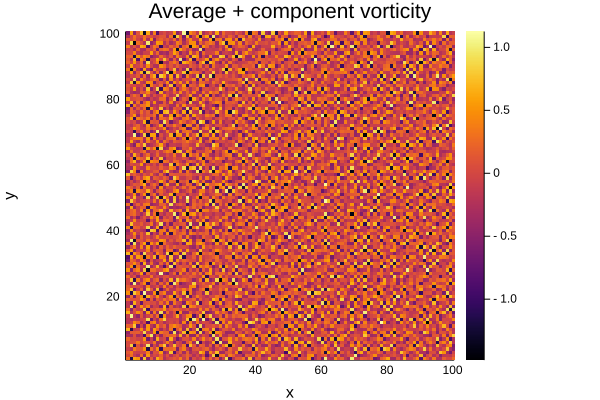

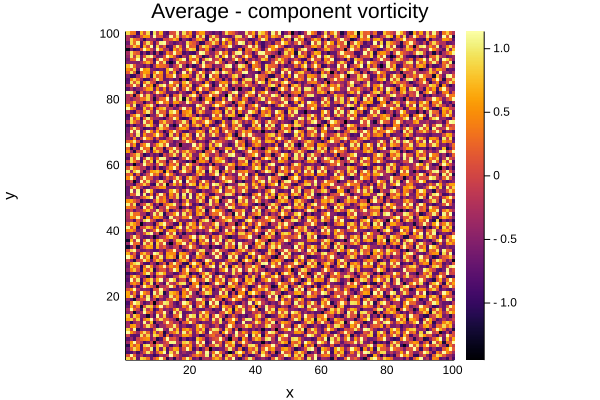

In [90]:
plotStructureFunctionVortexLattice(avV⁺, avV⁻, V⁺[rand(1:10)], V⁻[rand(1:10)], avS⁺, avS⁻, k_matrix)

In [32]:
mkcdSystemDirectory(syst, 30, 100)

There is a neighboring Data directory. Changing to this.
Made directory at /home/nicolai/Documents/Work/PhD/Numerikk/MC/finite-temp-vortex-lattice/Data/VORTEX_GAMMA_1.0_g_0.3_NU_0.3_f_-0.12_T_0.09_L_100_M_30
Writing folder name VORTEX_GAMMA_1.0_g_0.3_NU_0.3_f_-0.12_T_0.09_L_100_M_30 to last_folder.txt


1

In [33]:
pwd()

"/home/nicolai/Documents/Work/PhD/Numerikk/MC/finite-temp-vortex-lattice/Data/VORTEX_GAMMA_1.0_g_0.3_NU_0.3_f_-0.12_T_0.09_L_100_M_30"

In [37]:
plotStructureFunctionVortexLatticeS(avV⁺, avV⁻, V⁺[rand(1:10)], V⁻[rand(1:10)], avS⁺, avS⁻)

S⁺(0) ≈ 1.5716125757423147e-34
S⁻(0) ≈ 1.1240151364942047e-33
The proportion of vortices (n⁺, n⁻) in snapshot
% of vortex kind (-1, -1): 	7
% of vortex kind (-1, 0): 	13
% of vortex kind (-1, 1): 	7
% of vortex kind (0, -1): 	15
% of vortex kind (0, 0): 	22
% of vortex kind (0, 1): 	11
% of vortex kind (1, -1): 	5
% of vortex kind (1, 0): 	8
% of vortex kind (1, 1): 	6

Sum of + component vorticity in the snapshot: 1.6653345369377348e-15
Sum of - component vorticity in the snapshot: -9.32171007050897e-14


In [39]:
writeSimulationConstants(syst, sim, 30, 100)

29

# Saving States and simulation output

In [55]:
for x=1:4, y=1:4
    println((x,y))
end

(1, 1)
(1, 2)
(1, 3)
(1, 4)
(2, 1)
(2, 2)
(2, 3)
(2, 4)
(3, 1)
(3, 2)
(3, 3)
(3, 4)
(4, 1)
(4, 2)
(4, 3)
(4, 4)


In [56]:
function save(ψ::State, filename::AbstractString, mode::AbstractString="w")
    if mode != "w" && mode != "a"
        println("$(mode) is not a valid file-opening option.")
        return 0
    end
    println("Saving state to file $(filename)")
    L = ψ.consts.L
    open(filename, mode) do f
        # Write line indicating start of state
        write(f, "state start\n")
        # Writing system constants on top of the file
        write(f, "$(ψ.consts.L)\n")
        write(f, "$(ψ.consts.γ)\n")
        write(f, "$(ψ.consts.g⁻²)\n")
        write(f, "$(ψ.consts.ν)\n")
        write(f, "$(ψ.consts.f)\n")
        write(f, "$(ψ.consts.β)\n")
        # Then starting writing the state lattice
        for x=1:L, y=1:L
            ϕ = ψ.lattice[y,x]
            write(f, "$(ϕ.A[1]):$(ϕ.A[2]):$(ϕ.θ⁺):$(ϕ.θ⁻):$(ϕ.u⁺):$(ϕ.u⁻)\n")
        end
        write(f, "end\n")
    end
    return 1
end

save (generic function with 2 methods)

In [59]:
save(ψ₁, "state1.dat")
save(ψ₂, "state2.dat")

Saving state to file state1.dat
Saving state to file state2.dat


1

In [78]:
writedlm("Sp_matrices.dat", S⁺)

In [79]:
S_new = readdlm("Sp_matrices.dat", Array{Float64,2})

LoadError: [91mat row 1, column 1 : ErrorException("file entry \"0.014855523606746709\" cannot be converted to Array{Float64,2}")[39m

In [83]:
?heatmap

search: heatmap heatmap! plots_heatmap plots_heatmap!



No documentation found.

`Plots.heatmap` is a `Function`.

```
# 1 method for generic function "heatmap":
heatmap(args...; kw...) in Plots at /home/nicolai/.julia/v0.6/RecipesBase/src/RecipesBase.jl:385
```


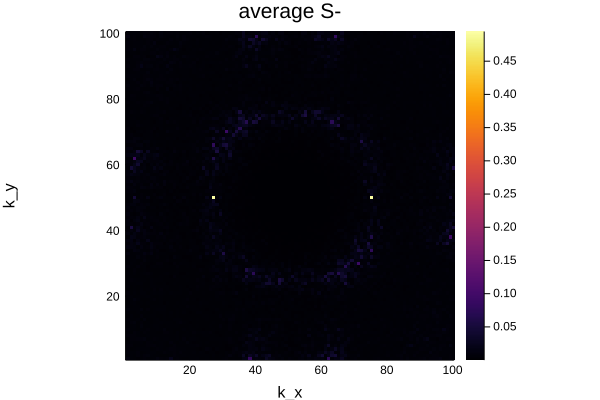

In [84]:
plt = heatmap(1:L, 1:L, avS⁻, title="average S-", xlabel="k_x", ylabel="k_y", aspect_ratio=1)